# The TL;DR of EDA


<img src="https://images.squarespace-cdn.com/content/v1/62ebd8e38f68d651ae7892a2/9def1f60-daba-4ff6-838f-ea9bcfc7ee6d/PyData_logo.png?format=1500" width="400" height="130">

**TLV 2024**


## Dependencies

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

## Conect to dataset

In [27]:
%%capture
!pip install ucimlrepo
from ucimlrepo import fetch_ucirepo

In [28]:
wine = fetch_ucirepo(id=109)

df = wine.data.original
df.to_csv('wine.csv')

In [29]:
df

,Alcohol,Malicacid,Ash,Alcalinity_of_ash,Magnesium,Total_phenols,Flavanoids,Nonflavanoid_phenols,Proanthocyanins,Color_intensity,Hue,0D280_0D315_of_diluted_wines,Proline,class
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,1
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,1
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740,3
174,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750,3
175,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835,3
176,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840,3


## Manual EDA - Pandas & Seaborn

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Alcohol                       178 non-null    float64
 1   Malicacid                     178 non-null    float64
 2   Ash                           178 non-null    float64
 3   Alcalinity_of_ash             178 non-null    float64
 4   Magnesium                     178 non-null    int64  
 5   Total_phenols                 178 non-null    float64
 6   Flavanoids                    178 non-null    float64
 7   Nonflavanoid_phenols          178 non-null    float64
 8   Proanthocyanins               178 non-null    float64
 9   Color_intensity               178 non-null    float64
 10  Hue                           178 non-null    float64
 11  0D280_0D315_of_diluted_wines  178 non-null    float64
 12  Proline                       178 non-null    int64  
 13  class

In [31]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Alcohol,178.0,13.000618,0.811827,11.03,12.3625,13.050,13.6775,14.83
Malicacid,178.0,2.336348,1.117146,0.74,1.6025,1.865,3.0825,5.80
Ash,178.0,2.366517,0.274344,1.36,2.2100,2.360,2.5575,3.23
Alcalinity_of_ash,178.0,19.494944,3.339564,10.60,17.2000,19.500,21.5000,30.00
Magnesium,178.0,99.741573,14.282484,70.00,88.0000,98.000,107.0000,162.00
Total_phenols,178.0,2.295112,0.625851,0.98,1.7425,2.355,2.8000,3.88
Flavanoids,178.0,2.029270,0.998859,0.34,1.2050,2.135,2.8750,5.08
Nonflavanoid_phenols,178.0,0.361854,0.124453,0.13,0.2700,0.340,0.4375,0.66
Proanthocyanins,178.0,1.590899,0.572359,0.41,1.2500,1.555,1.9500,3.58
Color_intensity,178.0,5.058090,2.318286,1.28,3.2200,4.690,6.2000,13.00


<Axes: >

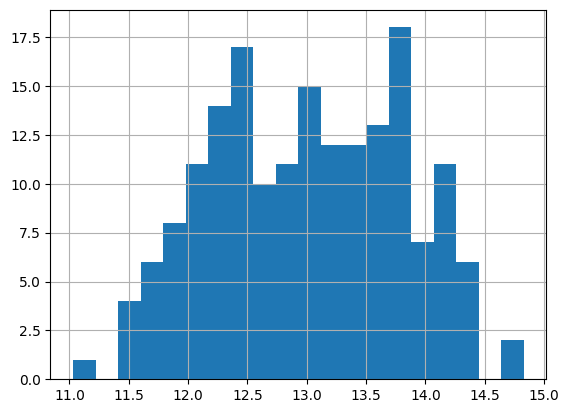

In [32]:
df['Alcohol'].hist(bins = 20)

In [33]:
df['class'].value_counts()

,count
class,
2,71
1,59
3,48


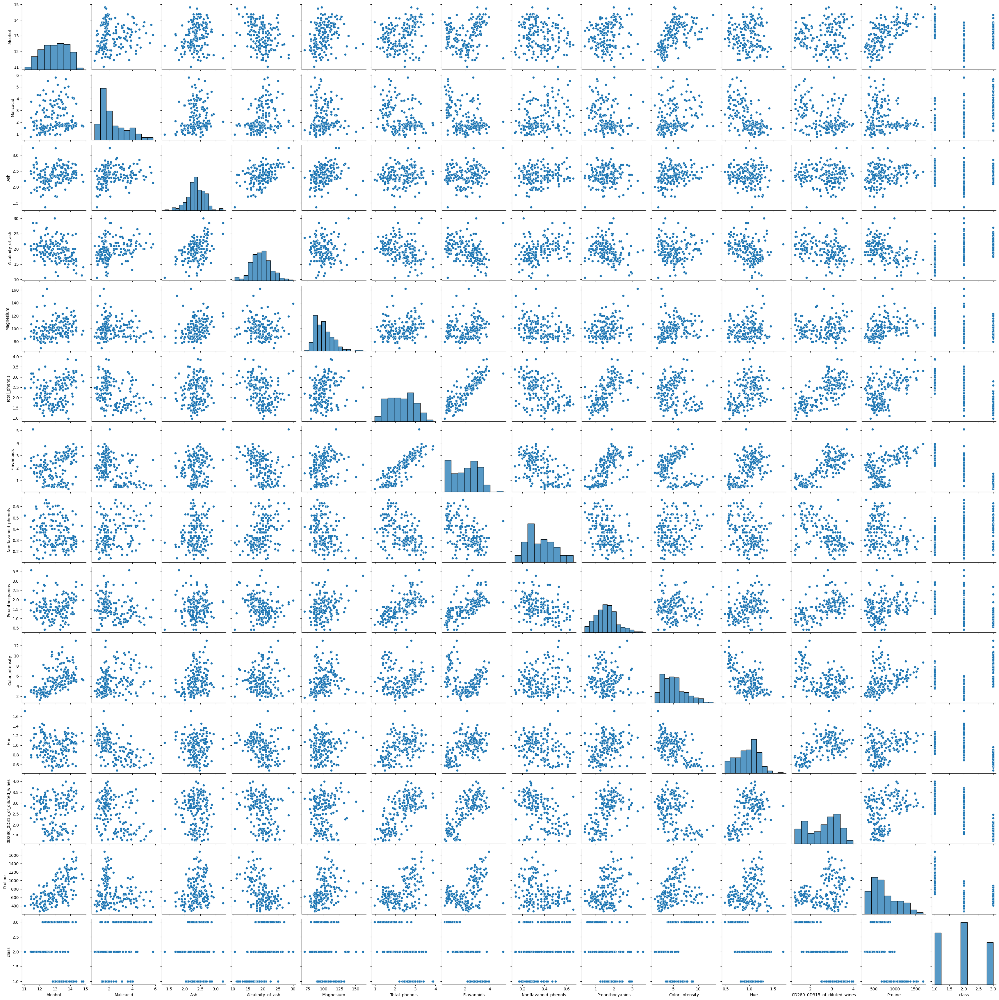

In [34]:
sns.pairplot(df)


<u> Flavonoids vs. Phenols Correlation Explained: </u>

* The flavonoids present in red wine include a wide range of compounds that affect colour, taste and mouth feel of the wine. Flavonoids are the main polyphenols present in red wine by weight, and constitute about 80 to 90% of total polyphenols. Flavonoids are derived primarily from the skin and or seed of red grapes.



* Wine contains many phenolic substances, most of which originate in the grape berry. The phenolics have a number of important functions in wine, affecting the tastes of bitterness and astringency, especially in red wine. Second, the color of red wine is caused by phenolics. Third, the phenolics are the key wine preservative and the basis of long aging.

Flavanoid contains Phenols so the positive strong correletaion is inevitable.


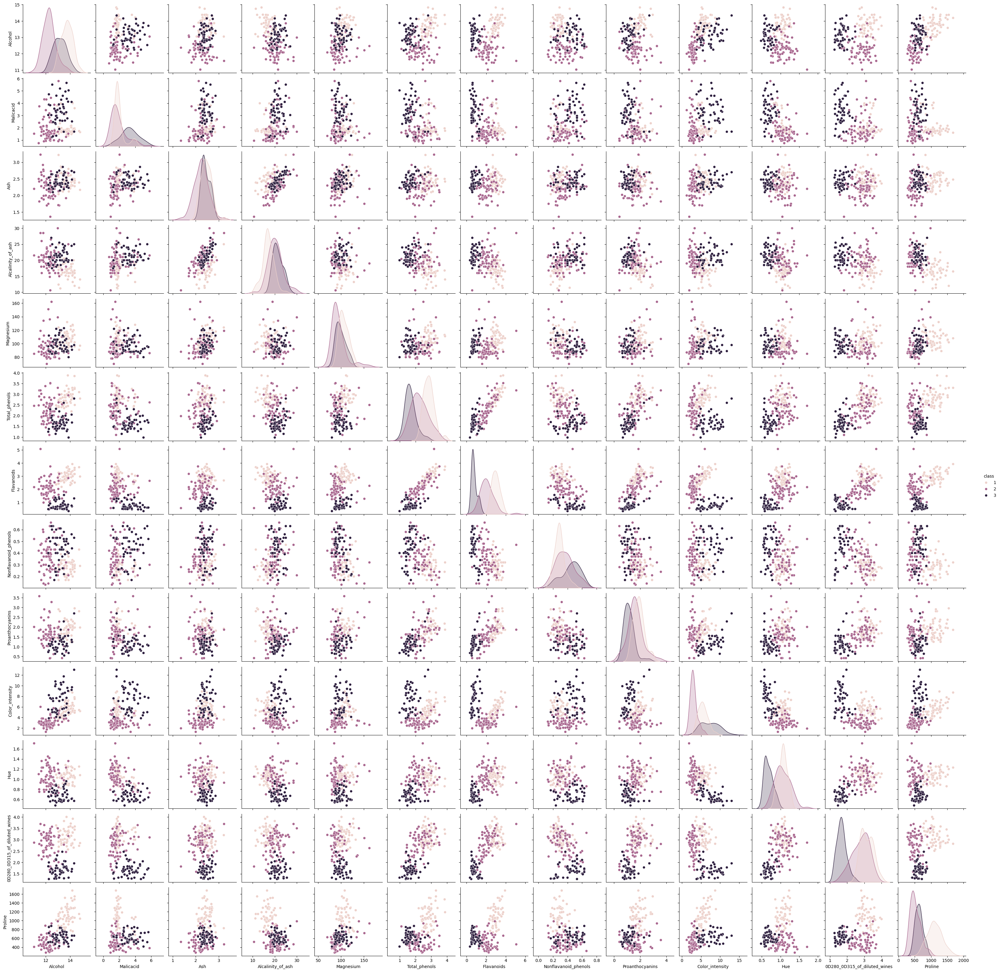

In [35]:
sns.pairplot(df, hue ='class')

## Automated EDA using Ydata - Profiling

In [36]:
%%capture
! pip install -U ydata-profiling

In [37]:
from ydata_profiling import ProfileReport

In [38]:
profile = ProfileReport(df, title = 'Dataset Profile Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Automated EDA using Clustering (Kmeans)

In [39]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from matplotlib.colors import ListedColormap


In [40]:
df_cluster = df.drop('class', axis=1)

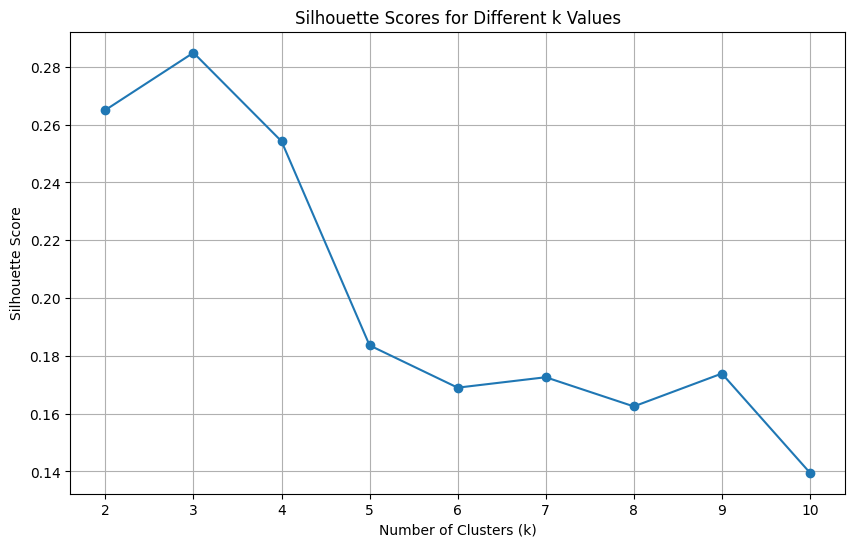

(3, 0.2848589191898987)

In [41]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df_cluster)

range_k = range(2, 11)
silhouette_scores = []

for k in range_k:
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(data_scaled)
    score = silhouette_score(data_scaled, cluster_labels)
    silhouette_scores.append(score)

best_k = range_k[silhouette_scores.index(max(silhouette_scores))]
best_score = max(silhouette_scores)

plt.figure(figsize=(10, 6))
plt.plot(range_k, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores for Different k Values')
plt.grid(True)
plt.show()

best_k, best_score


### Principal Component Analysis

In [42]:
kmeans = KMeans(n_clusters=best_k, random_state=42)
cluster_labels = kmeans.fit_predict(data_scaled)

pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)

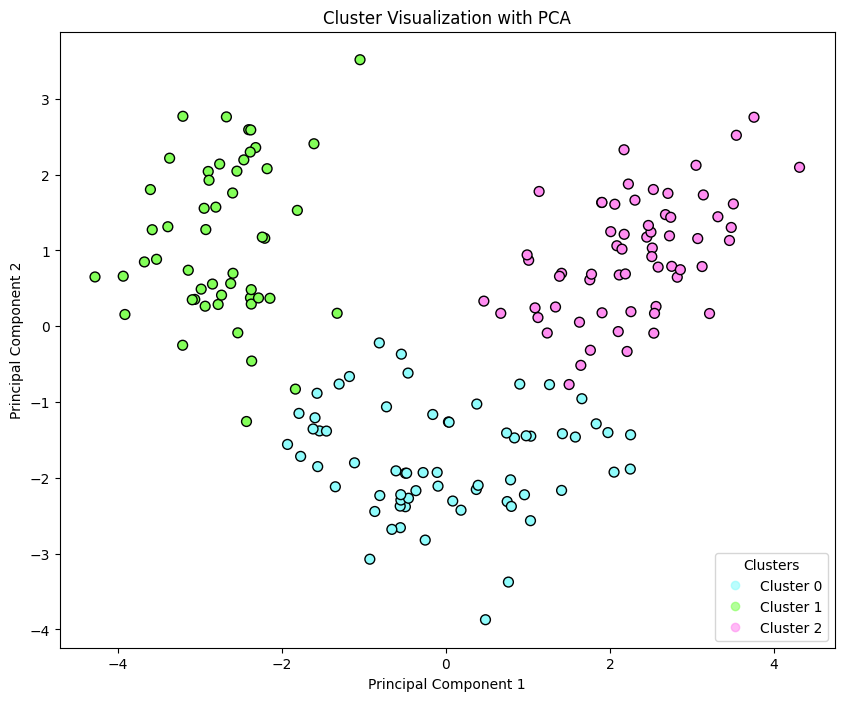

In [43]:
cluster_colors = ['#8FFCFC', '#83FF59', '#FF8DF1']
custom_cmap = ListedColormap(cluster_colors)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(data_pca[:, 0], data_pca[:, 1], c=cluster_labels, cmap=custom_cmap, edgecolor='k', s=50)
plt.title('Cluster Visualization with PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

handles, _ = scatter.legend_elements(prop='colors', alpha=0.6)
legend_labels = ['Cluster 0', 'Cluster 1', 'Cluster 2']
legend = plt.legend(handles, legend_labels, title="Clusters", loc='lower right')

plt.grid(False)
plt.show()

Analize the outliers by measuring the distance from the cluster centroid
1. Calculate distances of each point to its cluster centroid
2. Calculate threshold for outlier detection (e.g., 1.5 times the standard deviation)
3. Identify outliers

In [44]:
# 1
distances = kmeans.transform(data_scaled)  # distances to each centroid
distances_to_own_centroid = [distances[i][label] for i, label in enumerate(cluster_labels)]

# 2
distance_threshold = np.mean(distances_to_own_centroid) + 1.5 * np.std(distances_to_own_centroid)

# 3
outliers = np.where(distances_to_own_centroid > distance_threshold)[0]

df = pd.DataFrame(df, columns=df.columns)
df['Outlier'] = 0
df['Cluster'] = cluster_labels
df.loc[outliers, 'Outlier'] = 1

outlier_percentage = df.groupby('Cluster')['Outlier'].mean() * 100
outlier_percentage = outlier_percentage.rename("Outlier [%]")
outlier_percentage

,Outlier [%]
Cluster,
0,15.384615
1,1.960784
2,6.451613


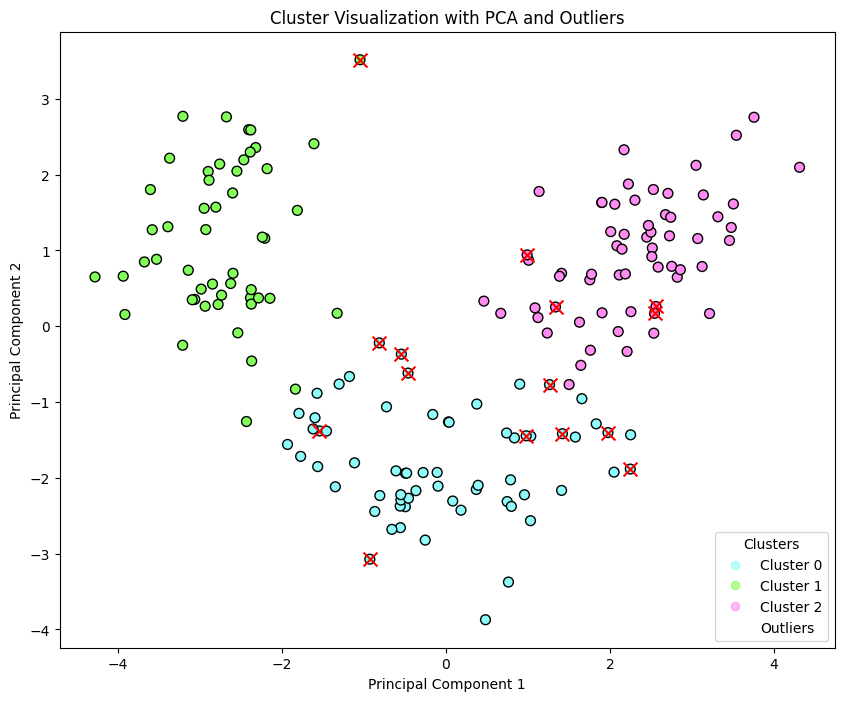

In [45]:
cluster_colors = ['#8FFCFC', '#83FF59', '#FF8DF1']
custom_cmap = ListedColormap(cluster_colors)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(data_pca[:, 0], data_pca[:, 1], c=cluster_labels, cmap=custom_cmap, edgecolor='k', s=50)

# Highlight outliers with a red 'x' marker
plt.scatter(data_pca[outliers, 0], data_pca[outliers, 1], c='red', marker='x', s=100, label='Outliers')

plt.title('Cluster Visualization with PCA and Outliers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

handles, _ = scatter.legend_elements(prop='colors', alpha=0.6)
legend_labels = ['Cluster 0', 'Cluster 1', 'Cluster 2']
legend = plt.legend(handles + [plt.Line2D([0], [0], marker='x', color='w', markerfacecolor='red', markersize=10, label='Outliers')],
                    legend_labels + ['Outliers'], title="Clusters", loc='lower right')

plt.grid(False)
plt.show()

Get list of outliers for further examination:


In [46]:
outlier_df = df[df['Outlier'] == 1].copy()

outlier_df = outlier_df.drop(columns='Outlier')

outlier_df

,Alcohol,Malicacid,Ash,Alcalinity_of_ash,Magnesium,Total_phenols,Flavanoids,Nonflavanoid_phenols,Proanthocyanins,Color_intensity,Hue,0D280_0D315_of_diluted_wines,Proline,class,Cluster
25,13.05,2.05,3.22,25.0,124,2.63,2.68,0.47,1.92,3.58,1.13,3.20,830,1,2
59,12.37,0.94,1.36,10.6,88,1.98,0.57,0.28,0.42,1.95,1.05,1.82,520,2,0
60,12.33,1.10,2.28,16.0,101,2.05,1.09,0.63,0.41,3.27,1.25,1.67,680,2,0
66,13.11,1.01,1.70,15.0,78,2.98,3.18,0.26,2.28,5.30,1.12,3.18,502,2,0
68,13.34,0.94,2.36,17.0,110,2.53,1.30,0.55,0.42,3.17,1.02,1.93,750,2,0
69,12.21,1.19,1.75,16.8,151,1.85,1.28,0.14,2.50,2.85,1.28,3.07,718,2,0
73,12.99,1.67,2.60,30.0,139,3.30,2.89,0.21,1.96,3.35,1.31,3.50,985,2,2
78,12.33,0.99,1.95,14.8,136,1.90,1.85,0.35,2.76,3.40,1.06,2.31,750,2,0
95,12.47,1.52,2.20,19.0,162,2.50,2.27,0.32,3.28,2.60,1.16,2.63,937,2,2
96,11.81,2.12,2.74,21.5,134,1.60,0.99,0.14,1.56,2.50,0.95,2.26,625,2,0


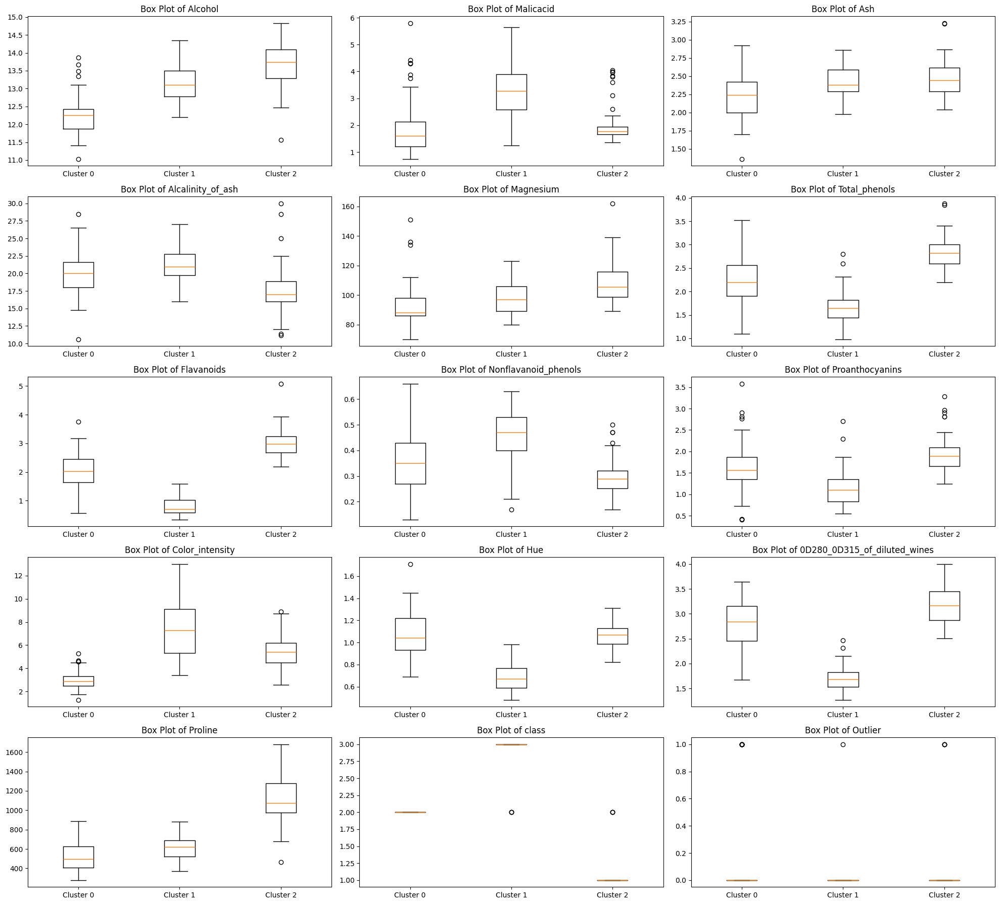

In [47]:
plt.figure(figsize=(20, 18))
num_features = len(df.columns) - 1  # exclude the cluster label column

for i, col in enumerate(df.columns[:-1]):  # exclude the cluster label column
    plt.subplot((num_features + 2) // 3, 3, i + 1)
    plt.title(f'Box Plot of {col}')
    plt.tight_layout()
    plt.boxplot([df[df['Cluster'] == k][col] for k in range(3)], labels=[f'Cluster {k}' for k in range(3)])

plt.show()

T-Test Comparison:

* Extract numerical columns excluding the 'Cluster' and 'Outlier' columns
* Loop through each numerical feature and perform t-test between each pair of clusters
* Perform a t-test analysis
* Check if p-value is greater than 0.05 (not statistically significant difference)
* Print results by column name




In [48]:
from scipy.stats import ttest_ind

numerical_columns = df.columns[:-3]  # Exclude 'Cluster' and 'Outlier' columns
cluster_labels = df['Cluster'].unique()

for col in numerical_columns:
    print("")
    for i in range(len(cluster_labels)):
        for j in range(i + 1, len(cluster_labels)):
            cluster_i_data = df[df['Cluster'] == cluster_labels[i]][col]
            cluster_j_data = df[df['Cluster'] == cluster_labels[j]][col]

            t_stat, p_value = ttest_ind(cluster_i_data, cluster_j_data)

            if p_value > 0.05:
                print(f"For {col}, clusters {cluster_labels[i]} and {cluster_labels[j]} match (p-value: {p_value:.4f})")
            else:
                print(f"For {col}, clusters {cluster_labels[i]} and {cluster_labels[j]} do not match (p-value: {p_value:.4f})")


For Alcohol, clusters 2 and 0 do not match (p-value: 0.0000)
For Alcohol, clusters 2 and 1 do not match (p-value: 0.0000)
For Alcohol, clusters 0 and 1 do not match (p-value: 0.0000)

For Malicacid, clusters 2 and 0 match (p-value: 0.5137)
For Malicacid, clusters 2 and 1 do not match (p-value: 0.0000)
For Malicacid, clusters 0 and 1 do not match (p-value: 0.0000)

For Ash, clusters 2 and 0 do not match (p-value: 0.0000)
For Ash, clusters 2 and 1 match (p-value: 0.2566)
For Ash, clusters 0 and 1 do not match (p-value: 0.0002)

For Alcalinity_of_ash, clusters 2 and 0 do not match (p-value: 0.0000)
For Alcalinity_of_ash, clusters 2 and 1 do not match (p-value: 0.0000)
For Alcalinity_of_ash, clusters 0 and 1 do not match (p-value: 0.0248)

For Magnesium, clusters 2 and 0 do not match (p-value: 0.0000)
For Magnesium, clusters 2 and 1 do not match (p-value: 0.0001)
For Magnesium, clusters 0 and 1 do not match (p-value: 0.0133)

For Total_phenols, clusters 2 and 0 do not match (p-value: 0.00

### PCA Explainability

In [49]:
pca.explained_variance_ratio_

array([0.36198848, 0.1920749 ])

In [50]:
sum(pca.explained_variance_ratio_)

0.5540633835693527

In [51]:
component_df = pd.DataFrame(
    data=pca.components_,
    columns=df_cluster.columns,
    index=[f'Component {i+1}' for i in range(pca.n_components_)]
)

component_df = component_df.T
component_df

,Component 1,Component 2
Alcohol,0.144329,0.483652
Malicacid,-0.245188,0.224931
Ash,-0.002051,0.316069
Alcalinity_of_ash,-0.239320,-0.010591
Magnesium,0.141992,0.299634
Total_phenols,0.394661,0.065040
Flavanoids,0.422934,-0.003360
Nonflavanoid_phenols,-0.298533,0.028779
Proanthocyanins,0.313429,0.039302
Color_intensity,-0.088617,0.529996


In [52]:
top3_component1 = component_df["Component 1"].nlargest(3)
top3_component2 = component_df["Component 2"].nlargest(3)

print("Top 3 component 1:")
print(top3_component1)
print("")
print("Top 3 component 2:")
print(top3_component2)

Top 3 component 1:
Flavanoids                      0.422934
Total_phenols                   0.394661
0D280_0D315_of_diluted_wines    0.376167
Name: Component 1, dtype: float64

Top 3 component 2:
Color_intensity    0.529996
Alcohol            0.483652
Proline            0.364903
Name: Component 2, dtype: float64


Get the model's accuracy by using crosstab between the original class label and the new cluster label.

In [53]:
crosstab = pd.crosstab(df['class'], df['Cluster'])

crosstab

Cluster,0,1,2
class,,,
1,0,0,59
2,65,3,3
3,0,48,0


Match the class number to the cluster number and check each row if it's correctly matched.

In [54]:
wine_cluster_match = crosstab.idxmax(axis=1)

df['correct_matches'] = df.apply(lambda x: 1 if x['Cluster'] == wine_cluster_match[x['class']] else 0, axis=1)

In [55]:
correct_matches = df['correct_matches'].sum()
accuracy = correct_matches / len(df) * 100

accuracy

96.62921348314607

Check how many of the ourliers were miss-labeled:

In [56]:
outlier_incorrect_matches_count = df[(df['Outlier'] == 1) & (df['correct_matches'] == 0)].shape[0]
outlier_incorrect_matches_count

3

## Automated EDA using LLMs

Insert below results into a chat based LLM model:

In [57]:
cluster_stats = df.groupby('Cluster').describe()

cluster_stats.transpose()

Cluster                        0          1          2
Alcohol         count  65.000000  51.000000  62.000000
                mean   12.250923  13.134118  13.676774
                std     0.533010   0.521855   0.559094
                min    11.030000  12.200000  11.560000
                25%    11.870000  12.780000  13.292500
...                          ...        ...        ...
correct_matches min     1.000000   0.000000   0.000000
                25%     1.000000   1.000000   1.000000
                50%     1.000000   1.000000   1.000000
                75%     1.000000   1.000000   1.000000
                max     1.000000   1.000000   1.000000

[128 rows x 3 columns]

In [58]:
key_features_means = df.groupby('Cluster')[['Alcohol', 'Malicacid', 'Flavanoids', 'Color_intensity']].mean()
key_features_means

,Alcohol,Malicacid,Flavanoids,Color_intensity
Cluster,,,,
0,12.250923,1.897385,2.050000,2.973077
1,13.134118,3.307255,0.818824,7.234706
2,13.676774,1.997903,3.003226,5.453548


### LLM output:

To guess which cluster might correspond to which type of wine, we would typically need additional specific wine characteristics or a labeled dataset indicating the type of wine each entry corresponds to. However, without explicit wine type labels in the dataset, we can make educated guesses based on typical wine profiles and how they might relate to the dataset's features, such as:

1. High Alcohol and Low Acidity (Malic Acid): Often corresponds to stronger, bolder wines like many reds.
2. High Flavanoids: Typically associated with red wines due to the presence of more tannins which come from the grape skins.
3. High Color Intensity: Likely indicates red wines due to deeper color from longer skin contact during fermentation.

Let's analyze the mean values of certain key features (like Alcohol, Malic Acid, Flavanoids, and Color Intensity) across the clusters to help hypothesize which cluster might represent which type of wine (red, white, or another type). We'll focus on these attributes to draw potential conclusions. ​​

Based on the average values of Alcohol, Malic Acid, Flavanoids, and Color Intensity for each cluster, we might hypothesize the following about the wine types:

**Cluster 0:**

Lower average alcohol content.
Moderate malic acid.
Moderate flavanoids.
Lower color intensity.
Potential Guess: Might represent white wines or light reds, as these typically have lower color intensity and a moderate amount of flavanoids.

**Cluster 1:**

Moderate alcohol content.
High malic acid.
Lower flavanoids.
High color intensity.
Potential Guess: Could represent rosé wines or specific types of red wines that are high in malic acid but not as rich in flavanoids, indicating less tannin presence.

**Cluster 2:**

Higher alcohol content.
Moderate malic acid.
High flavanoids.
Moderate to high color intensity.
Potential Guess: Likely represents red wines, especially those that are bolder and richer, indicated by higher alcohol, flavanoids (more tannins), and color intensity.

In [60]:
kmeans = KMeans(n_clusters=best_k, random_state=42)
cluster_labels = kmeans.fit_predict(data_scaled)

pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)

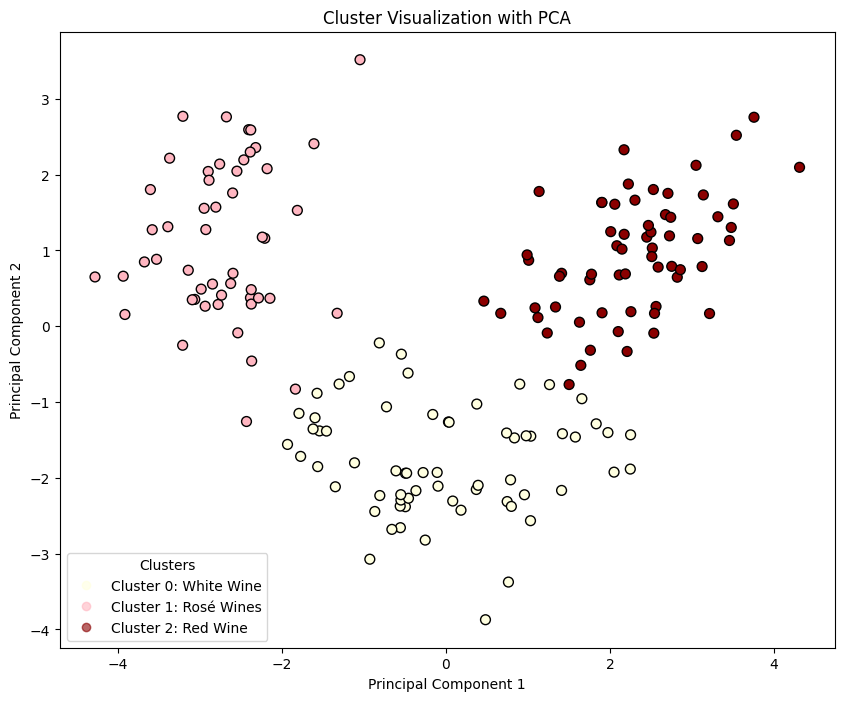

In [61]:
cluster_colors = ['#FFFFE0', '#FFB6C1', '#8B0000']
custom_cmap = ListedColormap(cluster_colors)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(data_pca[:, 0], data_pca[:, 1], c=cluster_labels, cmap=custom_cmap, edgecolor='k', s=50)
plt.title('Cluster Visualization with PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

handles, _ = scatter.legend_elements(prop='colors', alpha=0.6)
legend_labels = ['Cluster 0: White Wine', 'Cluster 1: Rosé Wines', 'Cluster 2: Red Wine']
legend = plt.legend(handles, legend_labels, title="Clusters")

plt.grid(False)
plt.show()